In [1]:
import os
import shutil
import pandas as pd
import numpy as np
import cv2
from sklearn.model_selection import train_test_split

# --- 1. Configuration & Folders ---
BASE_DIR = '/kaggle/working'
SOURCE_IMG_DIR = '/kaggle/input/datasets/ansuman30sahu/tubedetection/images-20260512T112012Z-3-001/images'      
CSV_PATH = '/kaggle/input/datasets/ansuman30sahu/tubedetection/annotations.csv'   

for split in ['train', 'val']:
    os.makedirs(os.path.join(BASE_DIR, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(BASE_DIR, split, 'labels'), exist_ok=True)

# --- 2. Process Data ---
df = pd.read_csv(CSV_PATH)
images = df['image'].unique()
train_imgs, val_imgs = train_test_split(images, test_size=0.15, random_state=42)

for img_name in images:
    subset = df[df['image'] == img_name]
    split = 'train' if img_name in train_imgs else 'val'
    src_path = os.path.join(SOURCE_IMG_DIR, img_name)
    dst_path = os.path.join(BASE_DIR, split, 'images', img_name)
    
    if os.path.exists(src_path):
        shutil.copy(src_path, dst_path)
        label_path = os.path.join(BASE_DIR, split, 'labels', img_name.rsplit('.', 1)[0] + '.txt')
        
        with open(label_path, 'w') as f:
            for _, row in subset.iterrows():
                cx, cy, w, h = row['center_x'], row['center_y'], row['bbox_w'], row['bbox_h']
                
                # A. Stable Corner Calculation
                # We rotate the corners manually to ensure a consistent index 0, 1, 2, 3
                angle_box = np.deg2rad(row['bbox_rotation'])
                cos_a, sin_a = np.cos(angle_box), np.sin(angle_box)
                # Standard relative corners
                rel_corners = np.array([[-w/2, -h/2], [w/2, -h/2], [w/2, h/2], [-w/2, h/2]])
                # Rotate and translate
                corners = np.zeros((4, 2))
                corners[:, 0] = cx + rel_corners[:, 0] * cos_a - rel_corners[:, 1] * sin_a
                corners[:, 1] = cy + rel_corners[:, 0] * sin_a + rel_corners[:, 1] * cos_a
                
                # Upright BBox for YOLO
                min_x, max_x = np.min(corners[:, 0]), np.max(corners[:, 0])
                min_y, max_y = np.min(corners[:, 1]), np.max(corners[:, 1])
                box_cx, box_cy = ((min_x + max_x) / 2) / 640, ((min_y + max_y) / 2) / 480
                box_w, box_h = (max_x - min_x) / 640, (max_y - min_y) / 480
                
                # B. Joint and Tab 
                angle_dir = np.radians(row['angle_deg'])
                radius = max(w, h) * 0.45 
                tab_x, tab_y = cx + radius * np.cos(angle_dir), cy - radius * np.sin(angle_dir)
                joint_x, joint_y = cx - radius * np.cos(angle_dir), cy + radius * np.sin(angle_dir)
                
                # C. Formatting 6 Keypoints
                pts = []
                for pt in corners: pts.extend([pt[0]/640, pt[1]/480, 2])
                pts.extend([joint_x/640, joint_y/480, 2]) # Pt 5: Joint
                pts.extend([tab_x/640, tab_y/480, 2])     # Pt 6: Tab
                
                f.write(f"0 {box_cx:.5f} {box_cy:.5f} {box_w:.5f} {box_h:.5f} {' '.join(map(lambda x: f'{x:.5f}', pts))}\n")

# --- 3. Create YAML Config ---
yaml_content = f"""
path: {BASE_DIR}
train: train/images
val: val/images

# 6 Keypoints: 4 Corners, 1 Joint, 1 Tab.
kpt_shape: [6, 3] 

names:
  0: microcentrifuge_tube
"""
with open(os.path.join(BASE_DIR, 'tubes_6kpt.yaml'), 'w') as f:
    f.write(yaml_content)

print(f"✅ Dataset ready! Saved to {BASE_DIR}")

✅ Dataset ready! Saved to /kaggle/working


In [2]:
import os

# 1. Ensure the base directory exists
BASE_DIR = '/kaggle/working'
os.makedirs(BASE_DIR, exist_ok=True)

yaml_path = os.path.join(BASE_DIR, 'tubes_6kpt.yaml')

# 2. Write the YAML configuration
yaml_content = f"""
path: {BASE_DIR}
train: train/images
val: val/images

# 6 Keypoints: 4 Corners, 1 Joint, 1 Tab.
kpt_shape: [6, 3] 

names:
  0: microcentrifuge_tube
"""

with open(yaml_path, 'w') as f:
    f.write(yaml_content.strip())

# 3. Verify it was written successfully
if os.path.exists(yaml_path):
    print(f"✅ SUCCESSFULLY CREATED: {yaml_path}")
else:
    print(f"❌ FAILED TO CREATE: {yaml_path}. Check Kaggle storage space.")

✅ SUCCESSFULLY CREATED: /kaggle/working/tubes_6kpt.yaml


In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 20.4 MB/s eta 0:00:00


In [4]:
from ultralytics import YOLO

# Switch to Small model (v8s) for better feature extraction
model = YOLO('yolov8s-pose.pt') 

print("Starting high-precision training...")
results = model.train(
    data='/kaggle/working/tubes_6kpt.yaml', 
    epochs=150,
    imgsz=1024,           # HIGHER RESOLUTION: The most critical fix for small features
    batch=4,              # Keep batch low to prevent out-of-memory errors
    name='tube_precision_v2',
    pose=12.0,            # Emphasize pose (keypoint) accuracy in the loss function
    box=7.5,              # Box loss weight
    degrees=180.0,        # Max rotation augmentation (crucial for 360° detection)
    fliplr=0.0,           # Disabled to prevent mirroring the Joint and Tab
    flipud=0.0,           # Disabled to prevent vertical mirroring
    mosaic=1.0,            # Keep mosaic augmentation
    verbose=False,
    conf=0.50,
    iou=0.20
)
print("✅ Training complete!")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Starting high-precision training...
Ultralytics 8.4.50 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=0.5, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/tubes_6kpt.yaml, degrees=180.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=Fals


Generating visual comparisons for up to 11 images...



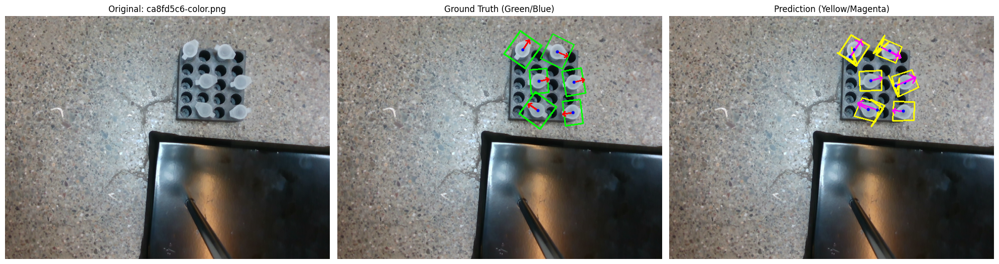

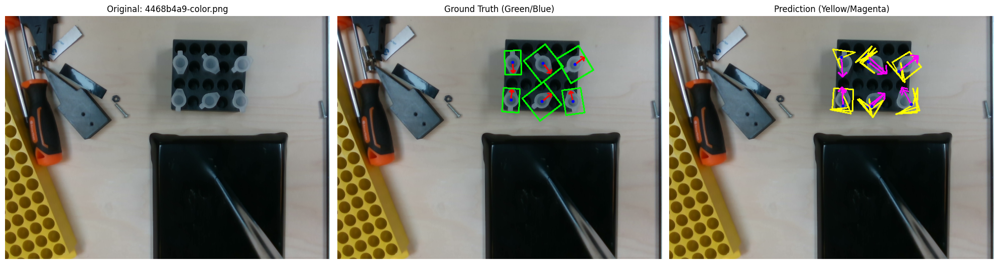

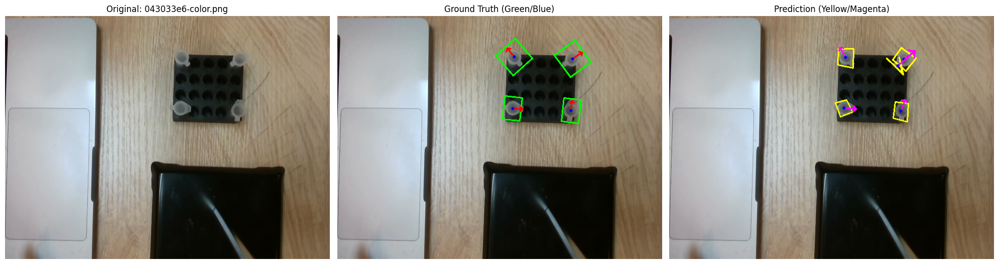

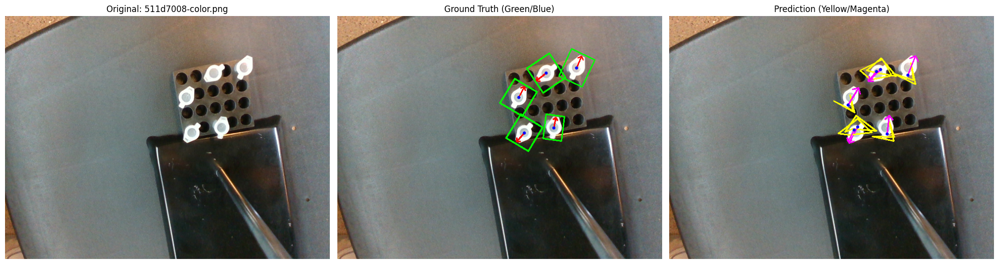

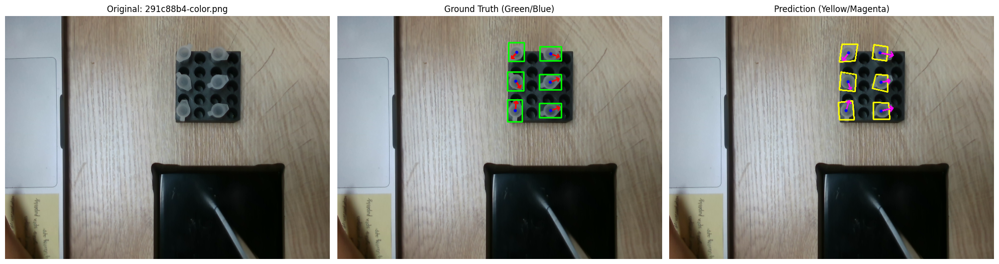

...

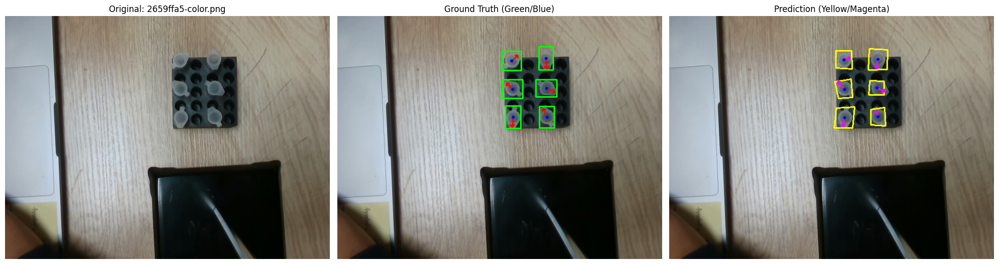

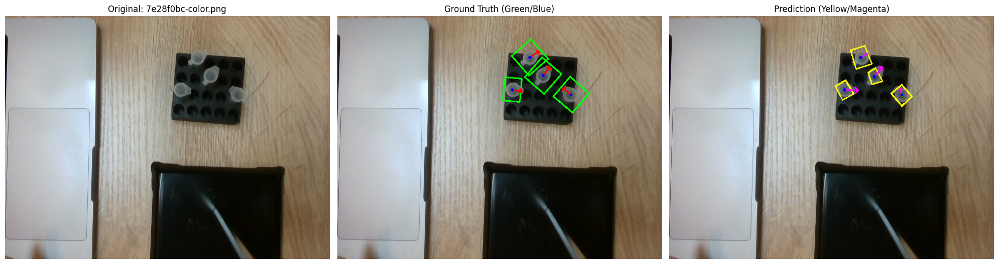

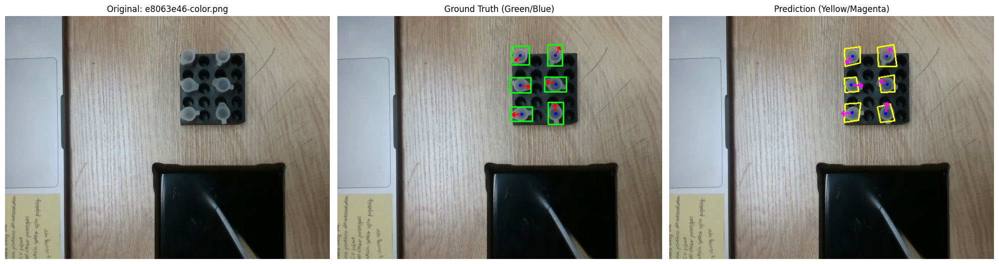

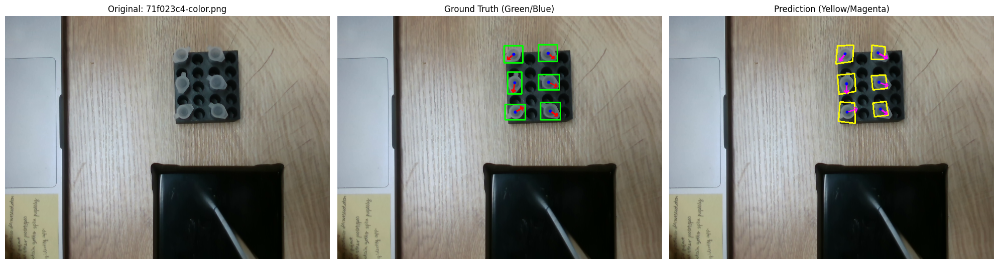

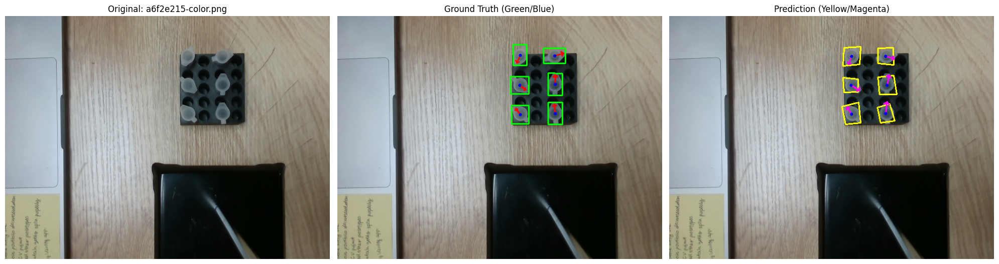

In [5]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

def calculate_shortest_angle_error(a1, a2):
    diff = abs(a1 - a2) % 360
    return min(diff, 360 - diff)

def evaluate_and_visualize(csv_path, val_dir, model_path, dist_threshold=20.0):
    model = YOLO(model_path)
    df = pd.read_csv(csv_path)
    val_images = [f for f in os.listdir(val_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    
    total_tp, total_fp, total_fn = 0, 0, 0
    angle_errors = []
    
    
    # ==========================================
    # 2. VISUALIZE UP TO 11 IMAGES
    # ==========================================
    if not val_images: return
    
    print("\nGenerating visual comparisons for up to 11 images...\n")
    images_to_show = val_images[:11]

    for img_name in images_to_show:
        img_path = os.path.join(val_dir, img_name)
        img_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        img_gt, img_pred = img_rgb.copy(), img_rgb.copy()

        # Draw Ground Truth
        annotations = df[df['image'] == img_name]
        for _, row in annotations.iterrows():
            cx, cy, w, h = row['center_x'], row['center_y'], row['bbox_w'], row['bbox_h']
            box = np.intp(cv2.boxPoints(((cx, cy), (w, h), row['bbox_rotation'])))
            cv2.drawContours(img_gt, [box], 0, (0, 255, 0), 2) 
            
            # GT Arrow
            angle_rad = np.radians(row['angle_deg'])
            end_x = int(cx + (max(w,h)*0.42) * np.cos(angle_rad))
            end_y = int(cy - (max(w,h)*0.42) * np.sin(angle_rad))
            cv2.arrowedLine(img_gt, (int(cx), int(cy)), (end_x, end_y), (255, 0, 0), 2, tipLength=0.3)
            cv2.circle(img_gt, (int(cx), int(cy)), 3, (0, 0, 255), -1)

        # Draw Prediction
        results = model(img_path, verbose=False)
        for result in results:
            if result.keypoints is not None and len(result.keypoints.xy) > 0:
                for pts in result.keypoints.xy.cpu().numpy():
                    if len(pts) < 6: continue
                    corners, tab = pts[0:4], pts[5]
                    box_pred = np.intp(corners)
                    pred_cx, pred_cy = np.mean(corners, axis=0)
                    
                    cv2.drawContours(img_pred, [box_pred], 0, (255, 255, 0), 2) 
                    cv2.arrowedLine(img_pred, (int(pred_cx), int(pred_cy)), (int(tab[0]), int(tab[1])), 
                                    (255, 0, 255), 2, tipLength=0.3)
                    cv2.circle(img_pred, (int(pred_cx), int(pred_cy)), 3, (0, 0, 255), -1)

        # Plot each image as it iterates
        fig, axes = plt.subplots(1, 3, figsize=(20, 6))
        axes[0].imshow(img_rgb); axes[0].set_title(f"Original: {img_name}"); axes[0].axis('off')
        axes[1].imshow(img_gt); axes[1].set_title("Ground Truth (Green/Blue)"); axes[1].axis('off')
        axes[2].imshow(img_pred); axes[2].set_title("Prediction (Yellow/Magenta)"); axes[2].axis('off')
        plt.tight_layout()
        plt.show()

# --- Execute ---

CSV_PATH = '/kaggle/input/datasets/ansuman30sahu/tubedetection/annotations.csv'
VAL_DIR = '/kaggle/working/val/images'
BEST_MODEL = '/kaggle/working/runs/pose/tube_precision_v2/weights/best.pt'

evaluate_and_visualize(CSV_PATH, VAL_DIR, BEST_MODEL)

In [6]:
import os
import shutil
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# --- 1. Define Your Kaggle Paths ---
CSV_PATH = '/kaggle/input/datasets/ansuman30sahu/tubedetection/annotations.csv'
# Assuming this is where your raw images live based on the CSV path:
SOURCE_IMG_DIR = '/kaggle/input/datasets/ansuman30sahu/tubedetection/images-20260512T112012Z-3-001/images' 

# The new, completely isolated OBB dataset directory
OBB_BASE = '/kaggle/working/obb_dataset'

# --- 2. Safely Create Directory Trees ---
for split in ['train', 'val']:
    # Using os.makedirs to build nested structures automatically
    os.makedirs(os.path.join(OBB_BASE, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(OBB_BASE, split, 'labels'), exist_ok=True)

# --- 3. Read Data & Split ---
df = pd.read_csv(CSV_PATH)
images = df['image'].unique()
train_imgs, val_imgs = train_test_split(images, test_size=0.15, random_state=42)

print("Building OBB Dataset (Images & Labels)...")
missing_images = 0

# --- 4. Process Images and Generate Strict OBB Labels ---
IMG_W, IMG_H = 640.0, 480.0 

for img_name in images:
    split = 'train' if img_name in train_imgs else 'val'
    src_img_path = os.path.join(SOURCE_IMG_DIR, img_name)
    dst_img_path = os.path.join(OBB_BASE, split, 'images', img_name)
    label_path = os.path.join(OBB_BASE, split, 'labels', img_name.rsplit('.', 1)[0] + '.txt')

    # Check if image exists before processing
    if not os.path.exists(src_img_path):
        missing_images += 1
        continue

    # Copy the image over
    shutil.copy(src_img_path, dst_img_path)

    # Calculate and write the OBB label (x1, y1, x2, y2, x3, y3, x4, y4)
    subset = df[df['image'] == img_name]
    with open(label_path, 'w') as f:
        for _, row in subset.iterrows():
            cx, cy = row['center_x'], row['center_y']
            w, h = row['bbox_w'], row['bbox_h']
            angle_rad = np.deg2rad(row['bbox_rotation'])
            cos_a, sin_a = np.cos(angle_rad), np.sin(angle_rad)
            dx, dy = w / 2.0, h / 2.0

            corners = [
                (cx - dx * cos_a + dy * sin_a, cy - dx * sin_a - dy * cos_a),
                (cx + dx * cos_a + dy * sin_a, cy + dx * sin_a - dy * cos_a),
                (cx + dx * cos_a - dy * sin_a, cy + dx * sin_a + dy * cos_a),
                (cx - dx * cos_a - dy * sin_a, cy - dx * sin_a + dy * cos_a)
            ]

            norm_corners = []
            for pt in corners:
                norm_corners.extend([pt[0] / IMG_W, pt[1] / IMG_H])

            f.write(f"0 {' '.join([f'{c:.5f}' for c in norm_corners])}\n")

# --- 5. Generate Configuration YAML ---
yaml_content = f"""
path: {OBB_BASE}
train: train/images
val: val/images
names:
  0: microcentrifuge_tube
"""
with open(os.path.join(OBB_BASE, 'tubes_obb.yaml'), 'w') as f:
    f.write(yaml_content.strip())

# --- 6. Final Verification ---
val_img_count = len(os.listdir(os.path.join(OBB_BASE, 'val/images')))
train_img_count = len(os.listdir(os.path.join(OBB_BASE, 'train/images')))

print("\n✅ OBB DATASET READY!")
print(f"📦 Train Images: {train_img_count}")
print(f"📦 Val Images:   {val_img_count}")
if missing_images > 0:
    print(f"⚠️ Warning: Could not find {missing_images} original images in {SOURCE_IMG_DIR}.")

Building OBB Dataset (Images & Labels)...

✅ OBB DATASET READY!
📦 Train Images: 59
📦 Val Images:   11


In [7]:
from ultralytics import YOLO

# Load the base OBB model
model_obb = YOLO('yolov8n-obb.pt') 

print("Training OBB Geometry Expert...")
model_obb.train(
    # ---> THE FIX IS HERE: Pointing to the new, clean OBB dataset <---
    data='/kaggle/working/obb_dataset/tubes_obb.yaml', 
    epochs=100,
    imgsz=640,
    batch=16,
    name='expert_obb_geometry_final'
)

Training OBB Geometry Expert...
Ultralytics 8.4.50 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/obb_dataset/tubes_obb.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-obb.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=expert_obb_geometry_final, nbs=64, nms=False, opset=

ultralytics.utils.metrics.OBBMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a5522679dc0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [8]:
from ultralytics import YOLO

# 1. Load the Pose model (using 's' for better feature resolution)
model_pose = YOLO('yolov8s-pose.pt') 

# 2. Train at high resolution to distinguish subtle hinge/lip features
print("Training Pose Direction Expert...")
model_pose.train(
    data='/kaggle/working/tubes_6kpt.yaml', # Your 6-keypoint yaml
    epochs=120,
    imgsz=1024,
    batch=4,
    name='expert_pose_direction',
    pose=12.0,
    degrees=180.0,
    fliplr=0.0 # Maintain Joint/Tab relative positions
)

Training Pose Direction Expert...
Ultralytics 8.4.50 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/tubes_6kpt.yaml, degrees=180.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=120, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-pose.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=expert_pose_direction, nbs=64, nms=False, opset=None, opti

ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a561e812750>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034, 

Loading Models for Rigorous Evaluation...

🏆 RIGOROUS ENSEMBLE VALIDATION (IoU MATCH) 🏆
Metrics Criteria: IoU > 0.45
---------------------------------------------
Precision:       1.0000
Recall:          0.9672
F1-Score:        0.9833
Mean Ang. Error: 8.34°

Generating visual comparisons for up to 11 images...



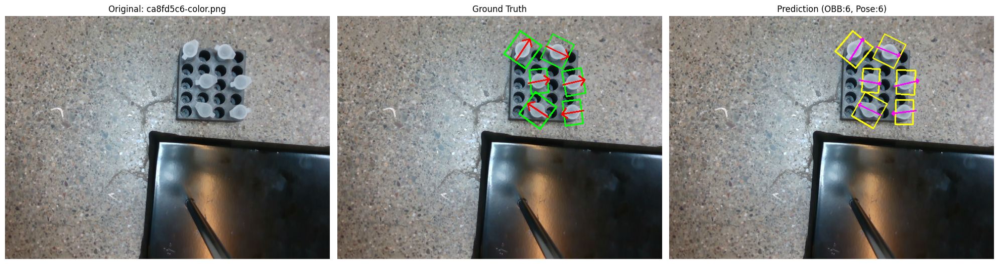

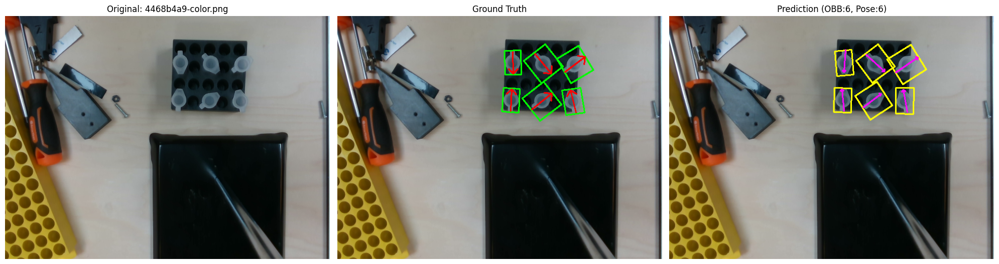

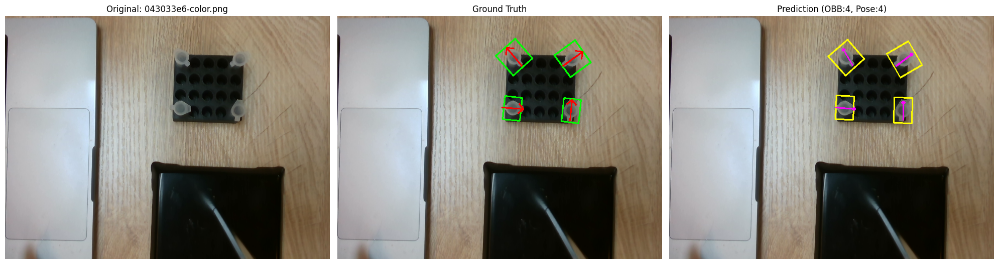

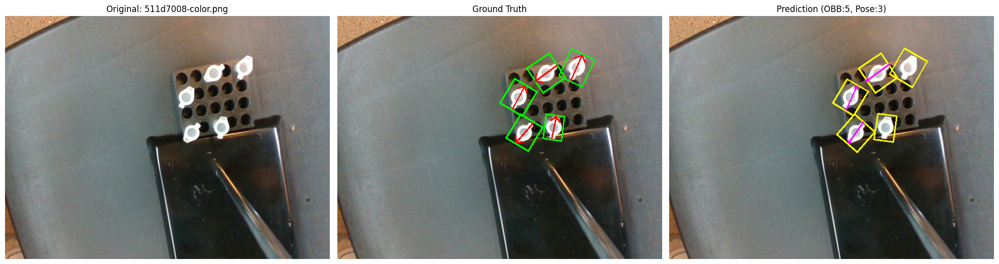

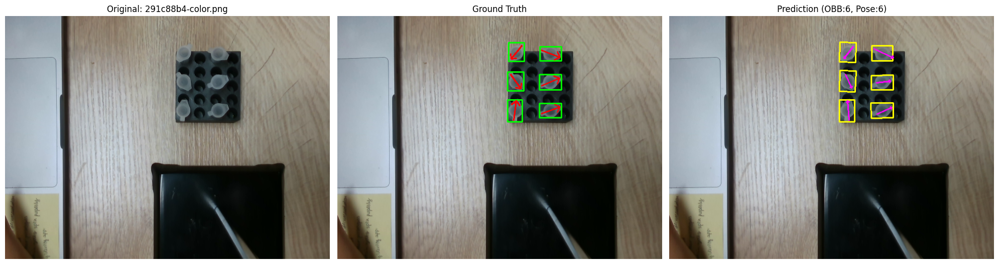

...

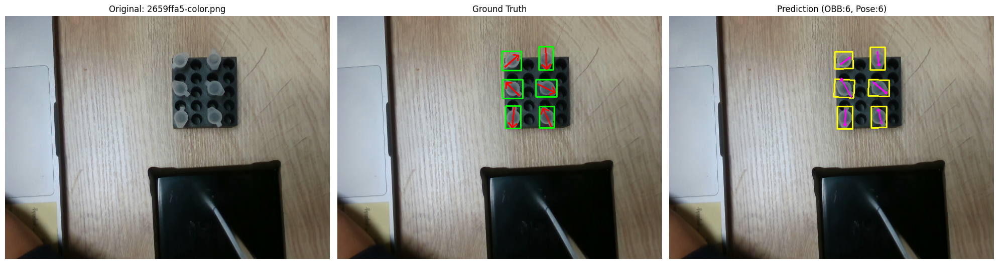

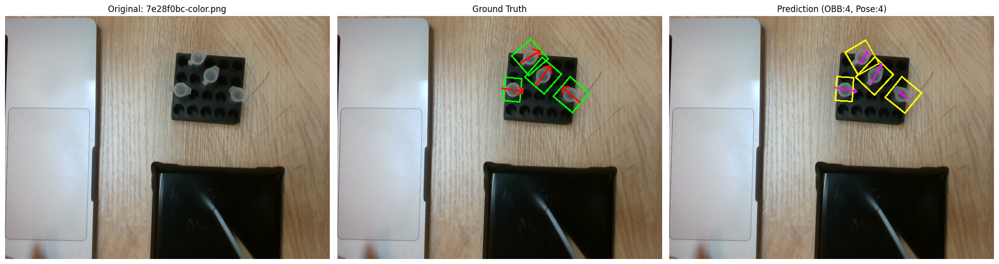

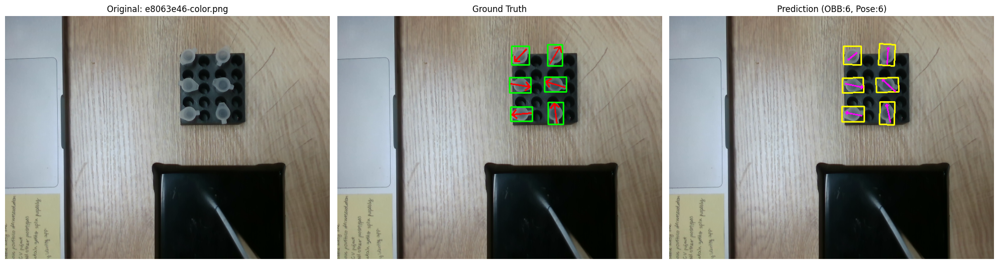

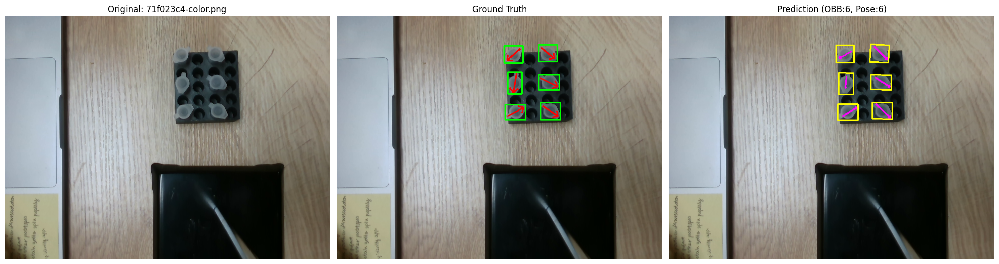

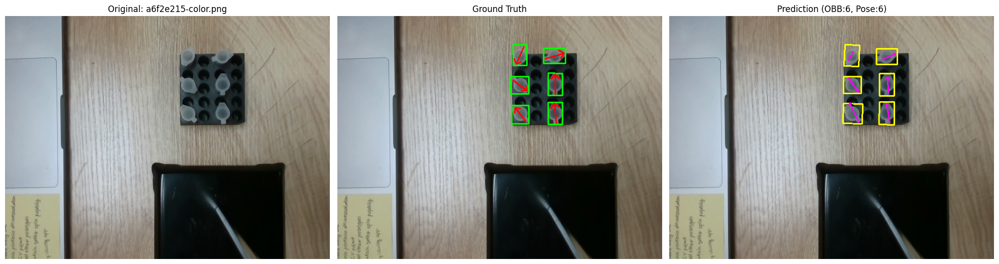

In [9]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

def calculate_shortest_angle_error(a1, a2):
    diff = abs(a1 - a2) % 360
    return min(diff, 360 - diff)

def get_rotated_iou(box1_raw, box2_raw):
    """
    Calculates IoU between two rotated rectangles.
    Input: ((cx, cy), (w, h), angle_deg)
    """
    # Get intersection area
    inter_type, inter_pts = cv2.rotatedRectangleIntersection(box1_raw, box2_raw)
    
    if inter_type == cv2.INTERSECT_NONE or inter_pts is None:
        return 0.0
    
    # Calculate area of intersection polygon
    inter_area = cv2.contourArea(inter_pts)
    
    # Calculate union
    area1 = box1_raw[1][0] * box1_raw[1][1]
    area2 = box2_raw[1][0] * box2_raw[1][1]
    union_area = area1 + area2 - inter_area
    
    return inter_area / union_area if union_area > 0 else 0.0

def evaluate_ensemble_with_metrics(csv_path, val_dir, obb_path, pose_path, iou_threshold=0.45, conf_eval=0.25):
    print("Loading Models for Rigorous Evaluation...")
    m_obb = YOLO(obb_path)
    m_pose = YOLO(pose_path)
    df = pd.read_csv(csv_path)
    val_images = [f for f in os.listdir(val_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    
    total_tp, total_fp, total_fn = 0, 0, 0
    angle_errors = []

    for img_name in val_images:
        img_path = os.path.join(val_dir, img_name)
        gt_data = df[df['image'] == img_name]
        
        # 1. Format Ground Truth as Rotated Rects
        gt_tubes = []
        for _, r in gt_data.iterrows():
            gt_tubes.append({
                'box_raw': ((r['center_x'], r['center_y']), (r['bbox_w'], r['bbox_h']), r['bbox_rotation']),
                'angle': r['angle_deg'],
                'matched': False
            })
            
        # 2. Run Inference
        res_obb = m_obb(img_path, verbose=False, conf=conf_eval, iou=0.20)[0]
        res_pose = m_pose(img_path, verbose=False, conf=conf_eval, iou=0.15)[0]
        
        # 3. Extract Predicted Ensemble Experts
        pred_boxes = []
        if res_obb.obb is not None:
            # YOLO OBB xywhr is [cx, cy, w, h, rotation_rad]
            for box in res_obb.obb.xywhr.cpu().numpy():
                pred_boxes.append({'cx': box[0], 'cy': box[1], 'w': box[2], 'h': box[3], 'rot': np.rad2deg(box[4])})
                
        pose_arrows = []
        if res_pose.keypoints is not None:
            for kpts in res_pose.keypoints.xy.cpu().numpy():
                if len(kpts) >= 6:
                    joint, tab = kpts[4], kpts[5]
                    p_cx, p_cy = (joint[0] + tab[0]) / 2, (joint[1] + tab[1]) / 2
                    dy, dx = -(tab[1] - joint[1]), tab[0] - joint[0]
                    pose_arrows.append({'cx': p_cx, 'cy': p_cy, 'angle': np.rad2deg(np.arctan2(dy, dx)) % 360, 'used': False})

        # 4. Step A: Internal Handshake (Match OBB Prediction to Pose Prediction)
        ensemble_preds = []
        for obb in pred_boxes:
            best_pose = None
            min_dist = 25.0 # Spatial gate for the internal handshake
            for pose in pose_arrows:
                if pose['used']: continue
                dist = np.hypot(obb['cx'] - pose['cx'], obb['cy'] - pose['cy'])
                if dist < min_dist:
                    min_dist = dist
                    best_pose = pose
            
            if best_pose:
                best_pose['used'] = True
                ensemble_preds.append({
                    'box_raw': ((obb['cx'], obb['cy']), (obb['w'], obb['h']), obb['rot']),
                    'angle': best_pose['angle'],
                    'matched_gt': False
                })

        # 5. Step B: GT Matching (Box-to-Box IoU & Arrow-to-Arrow Angle)
        for gt in gt_tubes:
            best_pred = None
            max_iou = -1.0
            
            for pred in ensemble_preds:
                if pred['matched_gt']: continue
                
                # CHECK 1: Geometry (Rotated IoU)
                iou = get_rotated_iou(gt['box_raw'], pred['box_raw'])
                
                if iou > iou_threshold and iou > max_iou:
                    max_iou = iou
                    best_pred = pred
            
            if best_pred:
                best_pred['matched_gt'] = True
                total_tp += 1
                # CHECK 2: Directional Accuracy
                err = calculate_shortest_angle_error(gt['angle'], best_pred['angle'])
                angle_errors.append(err)
            else:
                total_fn += 1
                
        total_fp += sum(1 for p in ensemble_preds if not p['matched_gt'])

    # Calculations
    precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0
    recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    print("\n" + "="*45)
    print("🏆 RIGOROUS ENSEMBLE VALIDATION (IoU MATCH) 🏆")
    print("="*45)
    print(f"Metrics Criteria: IoU > {iou_threshold}")
    print("-" * 45)
    print(f"Precision:       {precision:.4f}")
    print(f"Recall:          {recall:.4f}")
    print(f"F1-Score:        {f1:.4f}")
    print(f"Mean Ang. Error: {np.mean(angle_errors) if angle_errors else 0:.2f}°")
    print("="*45 + "\n")

    print("Generating visual comparisons for up to 11 images...\n")
    
    # Take up to the first 11 images in the folder
    images_to_show = val_images[:11]

    for sample_img in images_to_show:
        img_path = os.path.join(val_dir, sample_img)
        img_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        img_gt, img_pred = img_rgb.copy(), img_rgb.copy()

        # Draw Ground Truth
        for _, r in df[df['image'] == sample_img].iterrows():
            cx, cy, w, h = r['center_x'], r['center_y'], r['bbox_w'], r['bbox_h']
            box = np.intp(cv2.boxPoints(((cx, cy), (w, h), r['bbox_rotation'])))
            cv2.drawContours(img_gt, [box], 0, (0, 255, 0), 2)
            
            radius = max(w, h) * 0.45
            angle_rad = np.radians(r['angle_deg'])
            joint_x = int(cx - radius * np.cos(angle_rad))
            joint_y = int(cy + radius * np.sin(angle_rad))
            tab_x = int(cx + radius * np.cos(angle_rad))
            tab_y = int(cy - radius * np.sin(angle_rad))
            cv2.arrowedLine(img_gt, (joint_x, joint_y), (tab_x, tab_y), (255, 0, 0), 2, tipLength=0.3)

        # Force output using low confidence for diagnostic, strict IOU to stop double arrows
        res_obb = m_obb(img_path, verbose=False, conf=0.25, iou=0.20)[0]
        res_pose = m_pose(img_path, verbose=False, conf=0.25, iou=0.15)[0]
        
        boxes_drawn = 0
        if res_obb.obb is not None:
            for i in range(len(res_obb.obb.cls)):
                corners = res_obb.obb.xyxyxyxy[i].cpu().numpy()
                cv2.drawContours(img_pred, [np.intp(corners)], 0, (255, 255, 0), 2)
                boxes_drawn += 1

        arrows_drawn = 0
        if res_pose.keypoints is not None and len(res_pose.keypoints.xy) > 0:
            for kpts in res_pose.keypoints.xy.cpu().numpy():
                if len(kpts) >= 6:
                    joint, tab = kpts[4], kpts[5]
                    cv2.arrowedLine(img_pred, tuple(np.intp(joint)), tuple(np.intp(tab)), (255, 0, 255), 2)
                    arrows_drawn += 1

        # Render the plot for this specific image
        fig, ax = plt.subplots(1, 3, figsize=(20, 6))
        ax[0].imshow(img_rgb); ax[0].set_title(f"Original: {sample_img}"); ax[0].axis('off')
        ax[1].imshow(img_gt); ax[1].set_title("Ground Truth"); ax[1].axis('off')
        ax[2].imshow(img_pred); ax[2].set_title(f"Prediction (OBB:{boxes_drawn}, Pose:{arrows_drawn})"); ax[2].axis('off')
        plt.tight_layout()
        plt.show() # Show immediately so it stacks the 11 images vertically


# --- RUN ---
evaluate_ensemble_with_metrics(
    csv_path='/kaggle/input/datasets/ansuman30sahu/tubedetection/annotations.csv', 
    val_dir='/kaggle/working/val/images', 
    obb_path='/kaggle/working/runs/obb/expert_obb_geometry_final/weights/best.pt', 
    pose_path='/kaggle/working/runs/pose/expert_pose_direction/weights/best.pt',
    iou_threshold=0.45,
    conf_eval=0.25
)